# DATA UNDERSTANDING

In [2]:
import pysal
import pandas
import shapefile as shp
import matplotlib.pyplot as plt

%matplotlib inline
!python --version

Python 2.7.11 :: Anaconda 4.0.0 (x86_64)


In [3]:
#print( [str(i)for i in plt.style.available])

def shape_layer(shapefile, style="g-"):
    sf = shp.Reader(shapefile)
    coords = []
    for shape in sf.shapeRecords():
        x = [i[0] for i in shape.shape.points[:]]
        y = [i[1] for i in shape.shape.points[:]]
        plt.plot(x, y, style)


http://proximityone.com/census2010tlf.htm

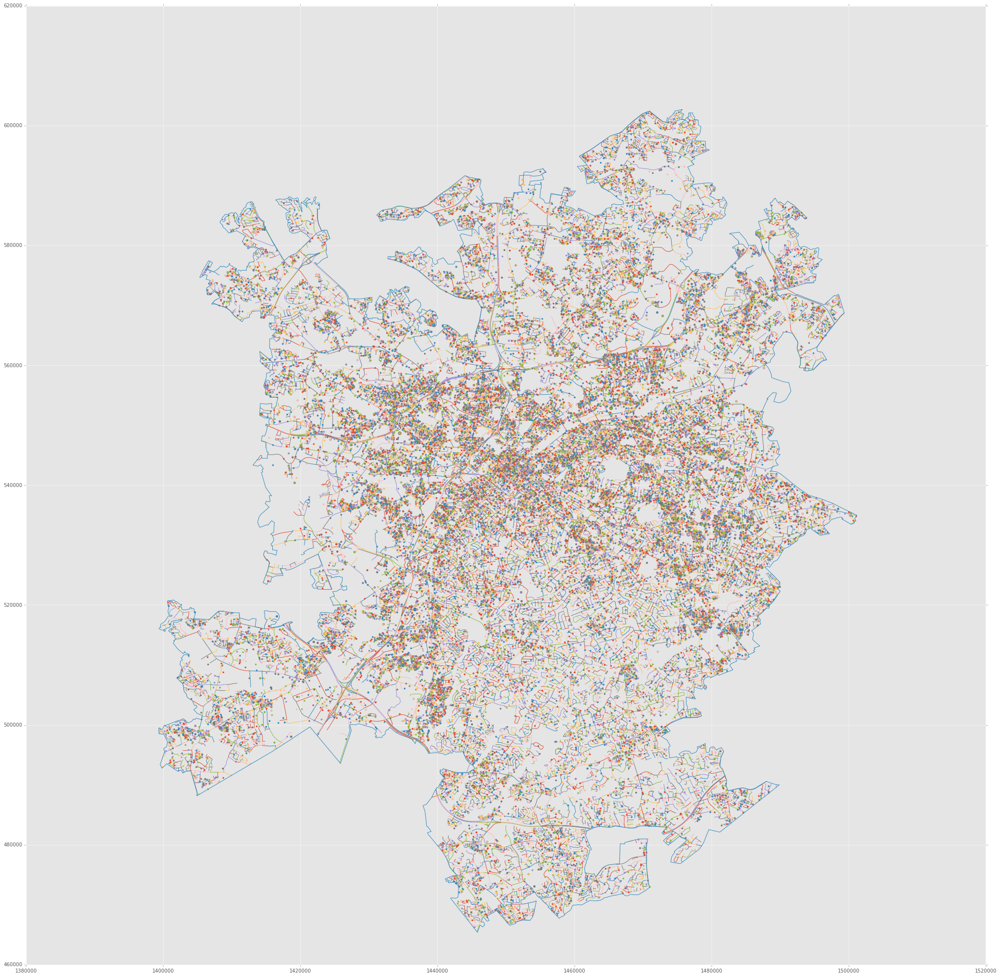

In [6]:
# CLT_BlockGroups_Attr
# CLT_Blocks_Attr
# CLT_Boundary
# CLT_Business_Attri

# CLT_Streets_crmCntAUNCC_Business
# CLT_Streets

# POI_WALMART
# POI_AlcoholicDrinkingPlaces_CLIP
# POI_HotelsMotels
# POI_Malls
# POI_ParknRideFacilities
# 
# CrimeIncident_CMPD_2010
# CrimeIncidents_UNCC_2010

fig_size = [35, 35]
plt.rcParams["figure.figsize"] = fig_size
plt.style.use('ggplot')

# plt.figure()
shape_layer("./dataset/Data/POI_AlcoholicDrinkingPlaces_CLIP.shp", style="bo")
shape_layer("./dataset/Data/CLT_Streets.shp", style="-")
shape_layer("./dataset/Data/CrimeIncident_CMPD_2010.shp", style=".")
shape_layer("./dataset/Data/CLT_Boundary.shp", style="-")
# plt.show()

---
### Block Groups

In [12]:
db_blocks_people = pysal.open('./dataset/Data/CLT_BlockGroups_Attr.dbf','r')
df_blocks_people = pandas.DataFrame(db_blocks_people[0:-1], columns=db_blocks_people.header)
# print df_blocks_people.ix[:3]
# df_blocks_people.ix[0:1, -6:]
print len(df_blocks_people)
df_blocks_people[:5].T

484


,0,1,2,3,4
STATEFP10,37,37,37,37,37
COUNTYFP10,119,119,119,119,119
TRACTCE10,005301,001400,001200,005847,000700
BLKGRPCE10,1,2,3,1,1
GEOID10,371190053011,371190014002,371190012003,371190058471,371190007001
NAMELSAD10,Block Group 1,Block Group 2,Block Group 3,Block Group 1,Block Group 1
MTFCC10,G5030,G5030,G5030,G5030,G5030
FUNCSTAT10,S,S,S,S,S
ALAND10,3692032,1051009,2111630,2937830,1271722
AWATER10,0,0,6882,19993,0


Charlotte block group with last 6 non-spatial attributes for 
- <b>ARPCIncome</b>: percapital Income; type: real, length 18
- <b>ARPerHEdu</b>: percentage of education with high school and abov
- <b>ARPerWork</b>: percentage of population employed
- <b>ARPerRMI5L</b>: percentage of population who rent and moved in less than 5 years ago
- <b>ARPer3MU</b>: percentage of home with 3 or more multiple unit structure


---
### Blocks
Charlotte blocks with last 6 attributes for 
- <b>ARPopDen</b>: population density; type: real, length 18
- <b>ARPerAA</b>: percentage of population who are American African
- <b>ARHeteInx</b>: heterogeneity index for races
- <b>ARPerM1724</b>: percentage of population who are 17-24 males
- <b>ARPerHOwn</b>: percentage of population who own home
- <b>ARPerSF</b>: percentage of families with single parent


In [16]:
db_blocks = pysal.open('./dataset/Data/CLT_Blocks_Attr.dbf','r')
df_blocks = pandas.DataFrame(db_blocks[0:-1], columns=db_blocks.header)
# df_blocks.ix[0:10, -6:]
print len(df_blocks.T)
df_blocks[:5].T

12


,0,1,2,3,4
STATEFP10,37,37,37,37,37
COUNTYFP10,119,119,119,119,119
TRACTCE10,005401,004600,004100,005521,005200
BLOCKCE,2028,2025,2005,3047,3043
BLOCKID10,371190054012028,371190046002025,371190041002005,371190055213047,371190052003043
PARTFLG,N,N,N,N,N
ARPopDen,0.000116269,0,0.000275848,0.000216187,8.52043e-05
ARPerAA,97.5904,0,21.4286,85.1064,50
ARHeteInx,0.0473218,0,0.482143,0.266184,0.5
ARPerM1724,3.61446,0,7.14286,4.25532,0


---
### Crime per Street

In [18]:
db_crime_per_street = pysal.open('./dataset/Data/CLT_Streets_crmCntAUNCC_Business.dbf','r')
df_crime_per_street = pandas.DataFrame(db_crime_per_street[0:-1], columns=db_crime_per_street.header)
# df_crime_per_street.sort(["crmCntAUNC"], ascending=[False])[0:10]
df_crime_per_street.sort_values(by="crmCntAUNC", ascending=False)[:10]
# df_crime_per_street[0:5]

,WHOLESTNAM,crmCntAUNC,BusinCnt
31873,N Tryon St,428,2
14911,E Trade St,392,19
904,Wilkinson Bv,376,26
7927,Sharon Rd,345,181
13145,Eastway Dr,269,24
7008,Galleria Bv,228,7
7455,S Tryon St,209,14
30361,Josh Birmingham Py,206,44
29507,Freedom Dr,163,65
31263,University City Bv,155,7


---
### Businesses

In [28]:
db_business = pysal.open('./dataset/Data/CLT_Business_Attri.dbf','r')
df_business = pandas.DataFrame(db_business[0:-1], columns=db_business.header)
pandas.set_option('display.max_rows', 100)
print(len(df_business))
df_business[:5].T

24374


,0,1,2,3,4
OBJECTID,18421,29072,7961,12303,648
Join_Count,1,0,1,1,1
ID,48567,2.01004e+07,288651,358823,359460
NUM_ADDR,339743,,464886,464886,
NUMADD_M,339743,,0,0,
Match_,g,,g,g,
year_,2008,2008,2008,2008,2008
Quarter,1,1,1,1,1
NAICS,531210,518210,541410,541310,621310
CntCode,119,119,119,119,119


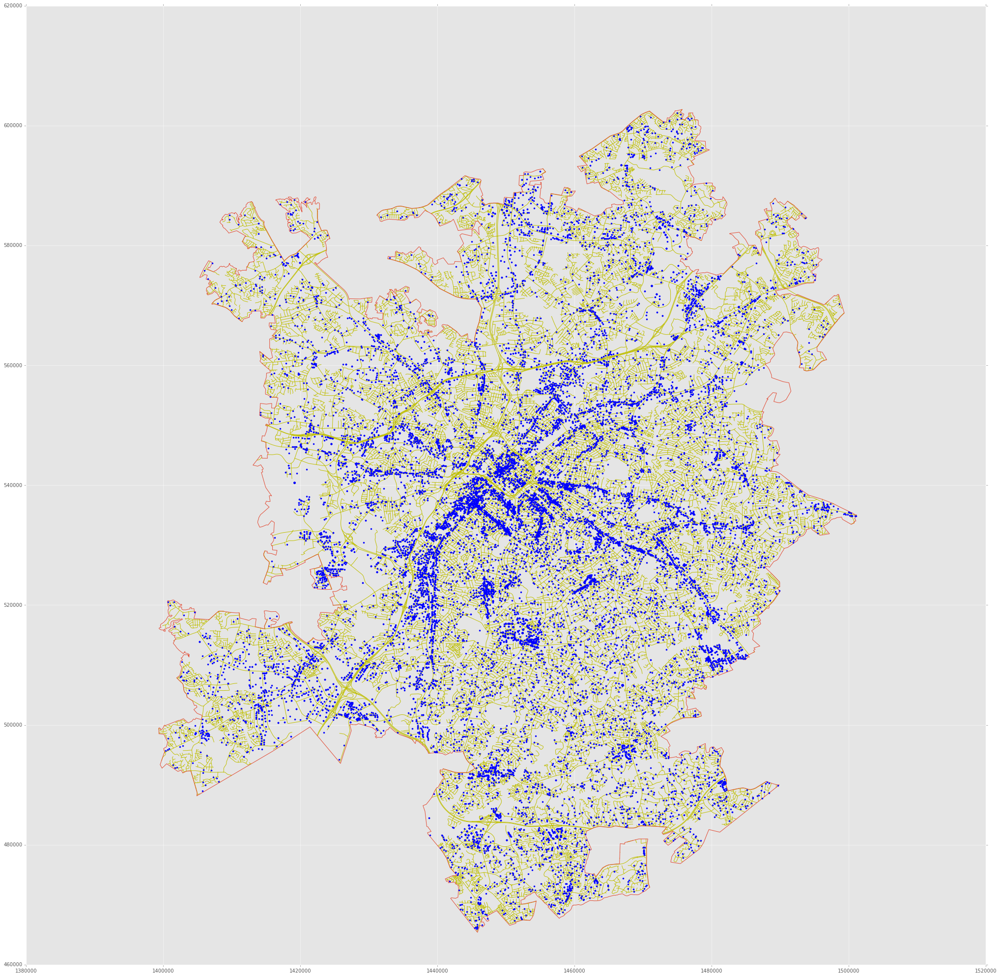

In [60]:
fig_size = [35, 35]
plt.rcParams["figure.figsize"] = fig_size
shape_layer("./dataset/Data/CLT_Streets.shp", style="y-", zorder=10)
shape_layer("./dataset/Data/CLT_Boundary.shp", style="-", zorder=10)
shape_layer("./dataset/Data/CLT_Business_Attri.shp", style="b.", zorder=10)

---

### Crimes

In [1]:
# set([ str(i)[0:10] for i in df_crimes["Report_Dat"].tolist()])

In [4]:
db_crimes = pysal.open('./dataset/Data/CrimeIncident_CMPD_2010.dbf','r')
df_crimes = pandas.DataFrame(db_crimes[0:-1], columns=db_crimes.header)
df_crimes[:10].T # .ix[0:10, -6:]

,0,1,2,3,4,5,6,7,8,9
OBJECTID_1,1,2,3,4,5,6,7,8,9,10
OBJECTID,1,2,3,4,5,6,7,8,9,10
Complaint_,2.01001e+13,2.01001e+13,2.01001e+13,2.01001e+13,2.01001e+13,2.01001e+13,2.01001e+13,2.01001e+13,2.01001e+13,2.01001e+13
ComplainNo,20100101000504,20100101000506,20100101000603,20100101001508,20100101001511,20100101001705,20100101002606,20100101004300,20100101004304,20100101004702
Block_No,1120,8305,2215,6205,5715,520,109,3416,5120,1524
Direction,,,,,,N,S,,,
Street_Nam,SCALEYBARK,SHINKANSEN,CARONIA,DOVE TREE,ELECTRA,TRYON,TRYON,VALERIE,MAGNASCO,KELSTON
Street_Typ,RD,DR,ST,LN,LN,ST,ST,DR,LN,PL
Suffix,,,,,,,,,,
Apt_No,,,,,A,,,,,205


In [ ]:
print db

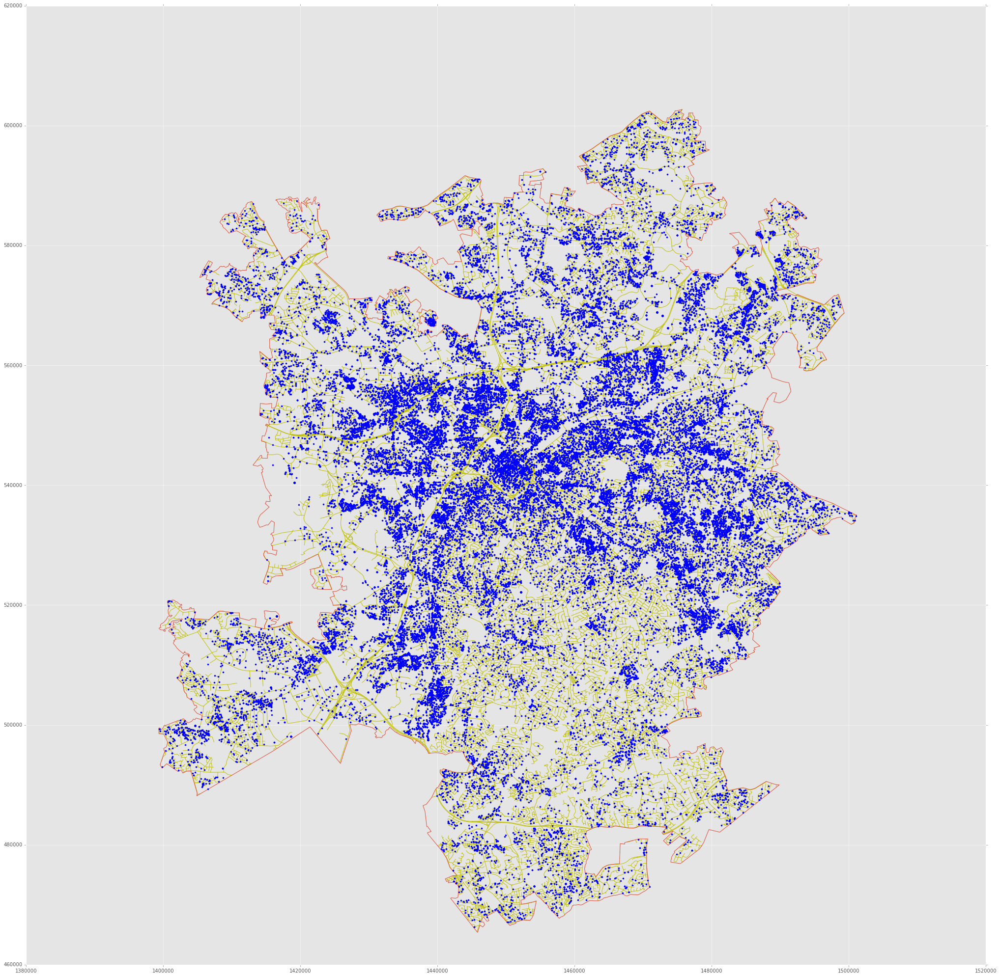

In [58]:
fig_size = [35, 35]
plt.rcParams["figure.figsize"] = fig_size
shape_layer("./dataset/Data/CLT_Streets.shp", style="y-", zorder=10)
shape_layer("./dataset/Data/CLT_Boundary.shp", style="-", zorder=10)
shape_layer("./dataset/Data/CrimeIncident_CMPD_2010.shp", style="b.", zorder=10)

### POI

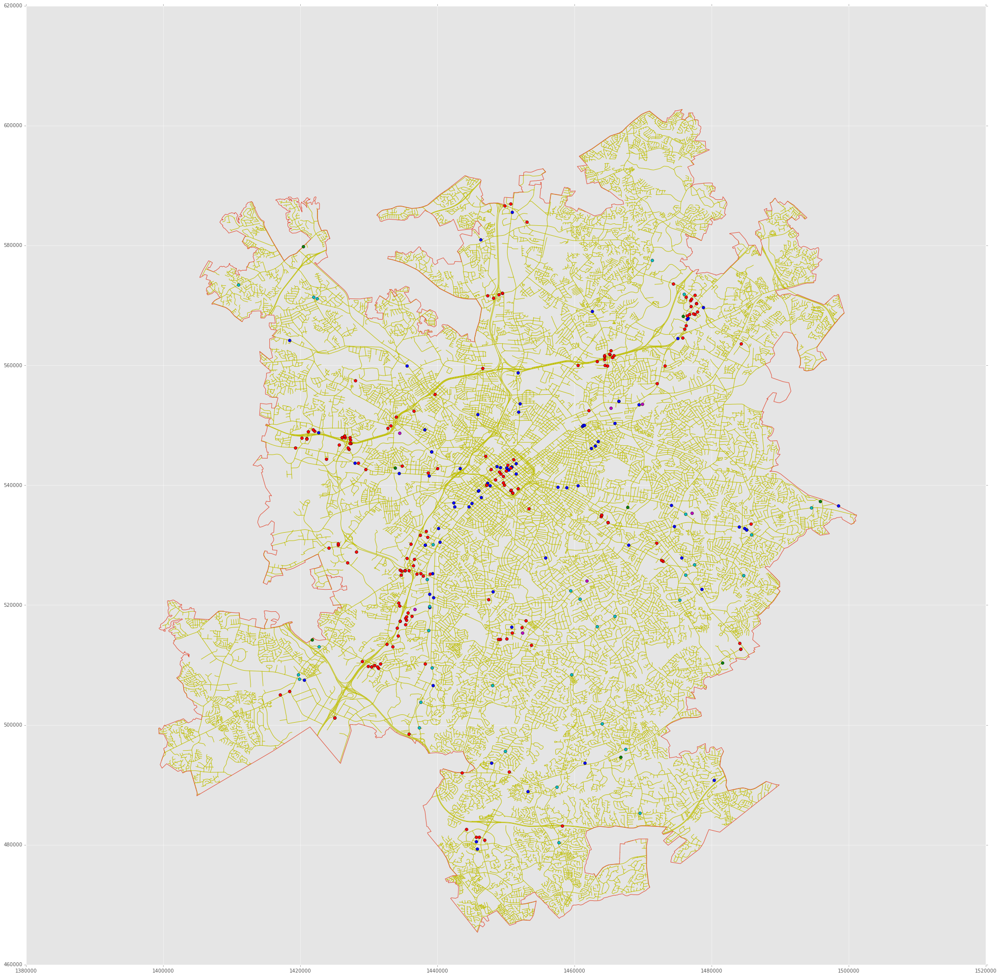

In [63]:
fig_size = [35, 35]
plt.rcParams["figure.figsize"] = fig_size
shape_layer("./dataset/Data/CLT_Streets.shp", style="y-")
shape_layer("./dataset/Data/CLT_Boundary.shp", style="-")

shape_layer("./dataset/Data/POI_WALMART.shp", style="go")
shape_layer("./dataset/Data/POI_AlcoholicDrinkingPlaces_CLIP.shp", style="bo")
shape_layer("./dataset/Data/POI_HotelsMotels.shp", style="ro")
shape_layer("./dataset/Data/POI_Malls.shp", style="mo")
shape_layer("./dataset/Data/POI_ParknRideFacilities.shp", style="co")

In [61]:
#              ist    attr
# walmart      7   ×  80
# alcoholic    84  ×  75
# hotelMotel   166 ×  74
#
# parkNride    33  ×  5     x,        y,       mode,    stopID,    desc
# malls        6   ×  5     objectID, address, bldg_sf, firm_name, name

db_mall = pysal.open('./dataset/Data/POI_Malls.dbf','r')
df_mall = pandas.DataFrame(db_mall[0:-1], columns=db_mall.header)
pandas.set_option('display.max_rows', 100)
print(len(df_mall))
df_mall[:].T

6


,0,1,2,3,4,5
OBJECTID,8,3,2,7,5,4
ADDRESS,4400 FAIRVIEW ROAD,500 TYVOLA ROAD,160 S SHARON AMITY ROAD,5651 CENTRAL AVENUE,3205 FREEDOM DRIVE,4500 N TRYON STREET
BLDG_SF,1161538,298748,273150,1220356,374988,310000
FIRM_NAME,TRAMMELL CROW COMPANY,N/A,HILL PARTNERS,GLIMCHER PROPERTIES,FREEDOM MALL PARTNERS,WALKER REAL ESTATE GROUP
NAME,SOUTHPARK MALL,TYVOLA PLACE,COTSWOLD MALL,EASTLAND MALL,FREEDOM MALL,TRYON PLACE


In [71]:
# walmart ha lo stesso header di business

l0 = df_walmart.columns.values
l1 = df_alc.columns.values
l2 = df_business.columns.values
l3 = df_hm.columns.values
l4 = df_mall.columns.values
l5 = df_pnr.columns.values

s0 = set(l0)
s1 = set(l1)
s2 = set(l2)
s3 = set(l3)
s4 = set(l4)
s5 = set(l5)

print len(s5 - s4)

5


80